# Importing Dependencies

### Instance Segmentation of Powder Particles and Satellites

This example is used to generate a visualization of an individual image


In [8]:
## regular module imports
import cv2
import json
import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
import pickle
import skimage.io
import sys

## detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import (
    DatasetCatalog,
    MetadataCatalog,
)
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.structures import BoxMode
#from detectron2.evaluation import coco_evaluation
from detectron2.data.datasets.coco import convert_to_coco_json
from detectron2.evaluation.coco_evaluation import instances_to_coco_json
from detectron2.utils.visualizer import GenericMask
import pycocotools.mask as mask_util
from skimage import measure
from imantics import Polygons, Mask




## Setting System Path

In [9]:
root = Path('../../')
sys.path.append(str(root))
from ampis import data_utils, visualize, export_anno

In [10]:
EXPERIMENT_NAME = 'satellite' # can be 'particle' or 'satellite'

cfg = get_cfg() # initialize cfg object
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))  # load default parameters for Mask R-CNN
cfg.MODEL.DEVICE='cuda'  # 'cpu' to force model to run on cpu, 'cuda' if you have a compatible gpu
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 # Since we are training separate models for particles and satellites there is only one class output
cfg.TEST.DETECTIONS_PER_IMAGE = 400 if EXPERIMENT_NAME == 'particle' else 150  # maximum number of instances that can be detected in an image (this is fixed in mask r-cnn)
                        # Increasing this may improve the training results, but will take longer to run (especially without a gpu!) 

## Establishing model Weights

In [13]:
# model weights will be downloaded if they are not present

weights_path = Path(str(root),'examples','powder','satellite_output_auto','model_final_W3.6.pth')
if weights_path.is_file():
    print('Using locally stored weights: {}'.format(weights_path))
else:
    weights_path = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
    print('Weights not found, weights will be downloaded from source: {}'.format(weights_path))
cfg.MODEL.WEIGHTs = str(weights_path)
cfg.OUTPUT_DIR = str(Path('..', 'satellite_output_stage_7'))
# make the output directory
cfg.TEST.DETECTIONS_PER_IMAGE = 400 if EXPERIMENT_NAME == 'particle' else 300  # maximum number of instances that can be detected in an image (this is fixed in mask r-cnn)
os.makedirs(Path(cfg.OUTPUT_DIR), exist_ok=True)
model_checkpoints = sorted(Path(cfg.OUTPUT_DIR).glob('*.pth'))  # paths to weights saved druing training
cfg.MODEL.WEIGHTS = str(model_checkpoints[-2])  # use the last model checkpoint saved during training. If you want to see the performance of other checkpoints you can select a different index from model_checkpoints.
print(str(model_checkpoints[-2]))
predictor = DefaultPredictor(cfg)  # create predictor object

Weights not found, weights will be downloaded from source: https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl
satellite_output_stage_7/model_0004999.pth


### Importing image, converting to polygon, and exporting detections


['', 'HP743_10S_250x', 'HP743_10S_500x', 'HP743_11S_250x', 'HP743_11S_500x', 'HP743_12S_250x', 'HP743_12S_500x', 'HP743_1S_250x', 'HP743_1S_500x', 'HP743_2S_250x', 'HP743_2S_500x', 'HP743_3S_250x', 'HP743_3S_500x', 'HP743_4S_250x', 'HP743_4S_500x', 'HP743_5S_250x', 'HP743_5S_500x', 'HP743_6S_250x', 'HP743_7S_250x', 'HP743_7S_500x', 'HP743_8S_250x', 'HP743_8S_500x', 'HP743_9S_250x', 'HP743_9S_500x', 'S01_02_SE1_300X06', 'S01_03_SE1_300X10', 'S02_01_SE1_1000X16', 'S02_01_SE1_300X14', 'S02_02_SE1_1000X20', 'S02_02_SE1_300X18', 'S02_03_SE1_1000X24', 'S02_03_SE1_300X22', 'S03_01_SE1_1250X28', 'S03_01_SE1_3000X27', 'S03_02_SE1_1250X35', 'S03_02_SE1_3000X36', 'S03_03_SE1_1250X41', 'S03_03_SE1_3000X42', 'S03_03_SE1_5000X43', 'S04_01_SE1_1000X45', 'S04_02_SE1_1000X50', 'S04_03_SE1_1000X53', 'S05_01_SE1_300X56', 'S05_02_SE1_1000X61', 'S05_02_SE1_300X59', 'S05_03_SE1_1000X65', 'S05_03_SE1_300X63', 'S06_01_SE1_300X68', 'S06_01_SE1_500X67', 'S06_02_SE1_500X71', 'S06_03_SE1_500X75', 'S07_01_SE1_1250

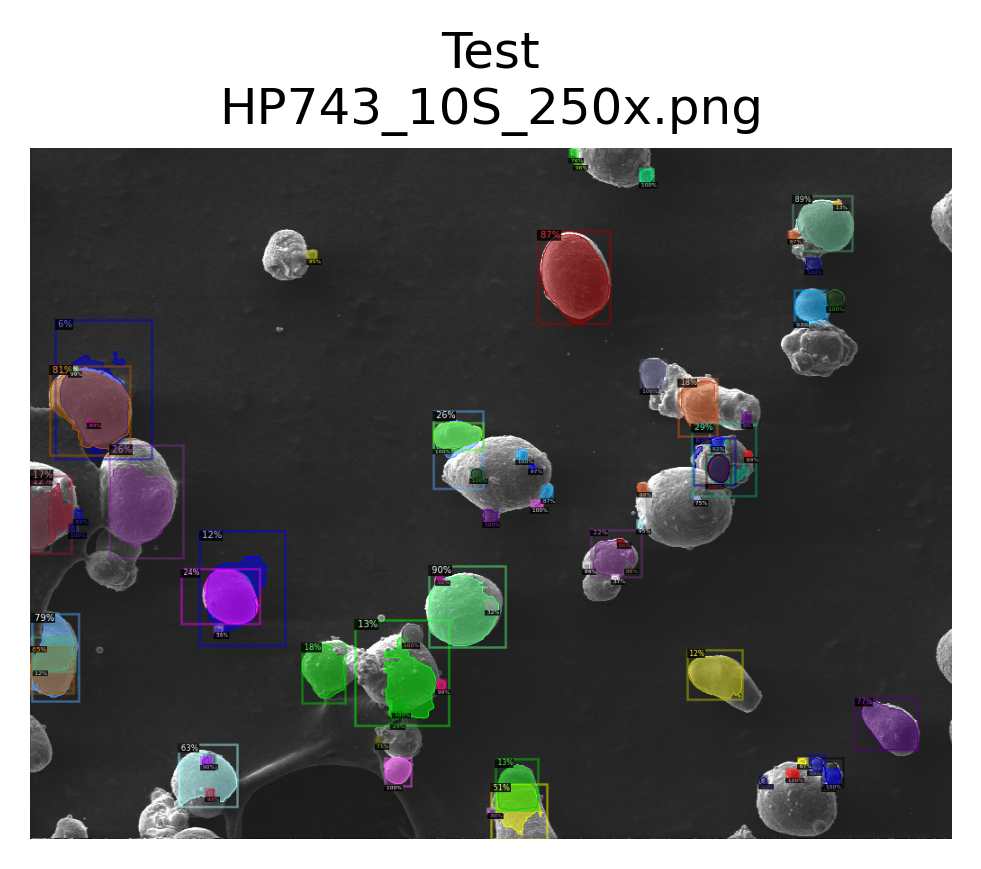

ddict info:
	path: Auto_annotate_images/HP743_10S_250x.png
	num_instances: 79
Annotating: HP743_10S_500x


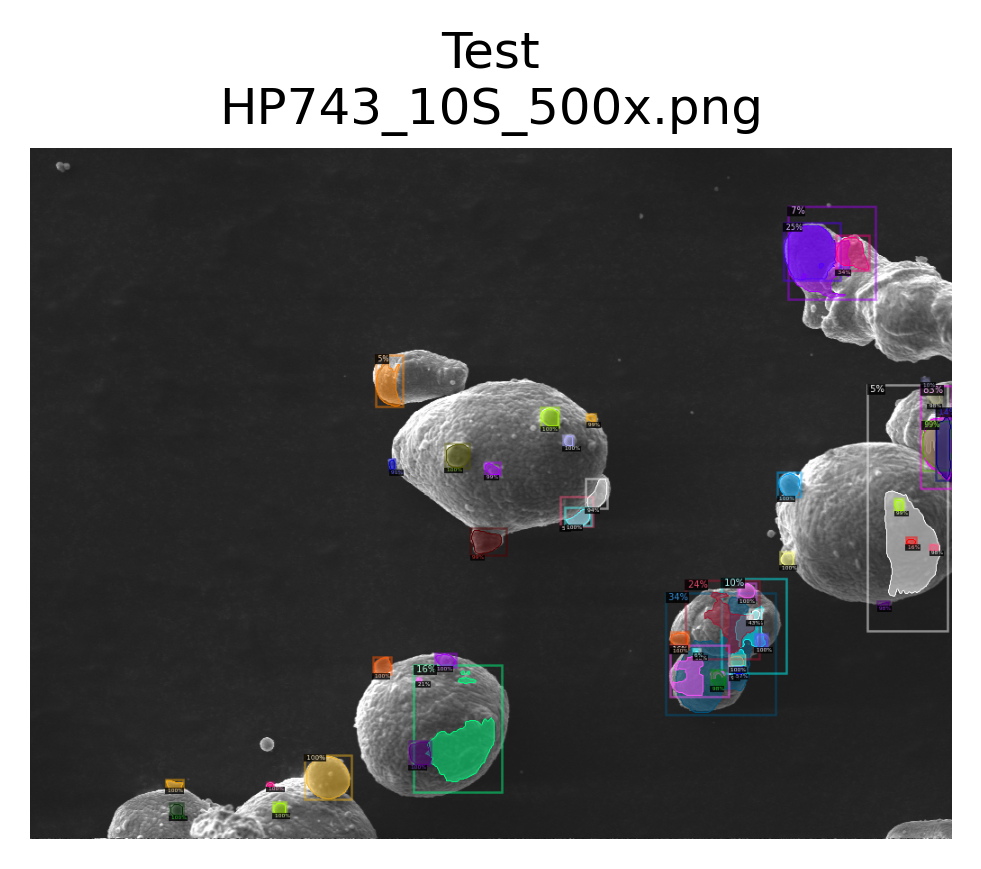

ddict info:
	path: Auto_annotate_images/HP743_10S_500x.png
	num_instances: 51
Annotating: HP743_11S_250x


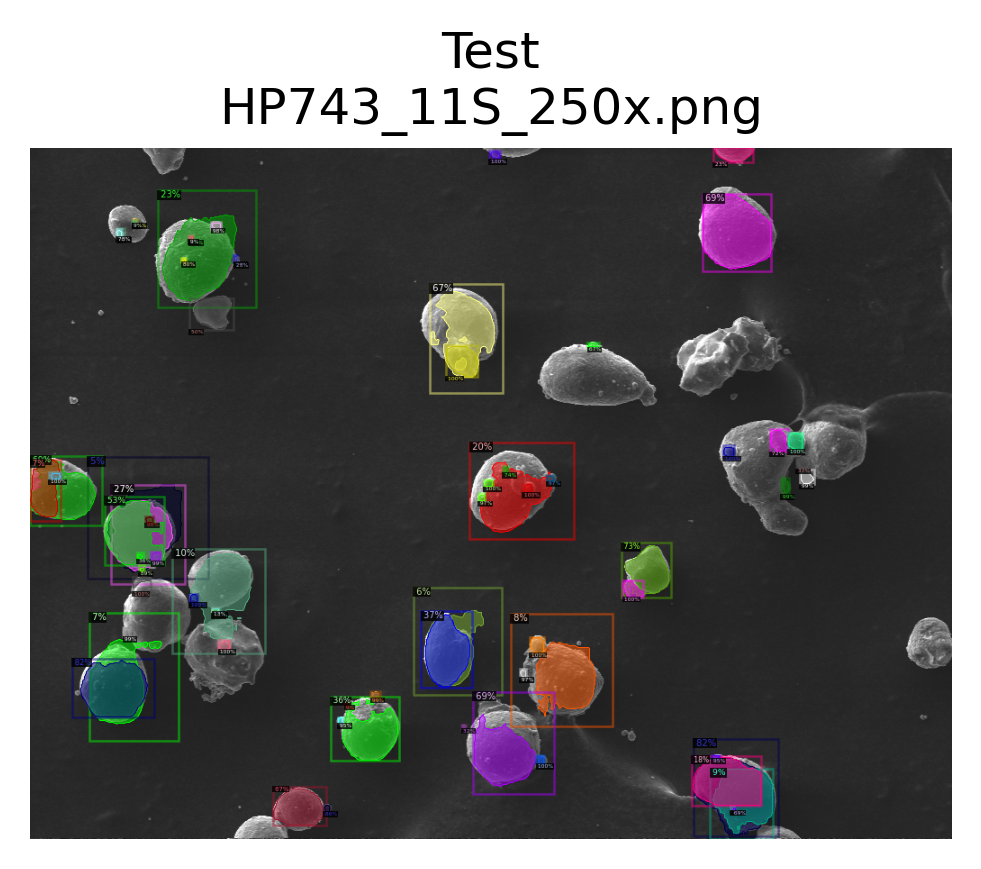

ddict info:
	path: Auto_annotate_images/HP743_11S_250x.png
	num_instances: 72
Annotating: HP743_11S_500x


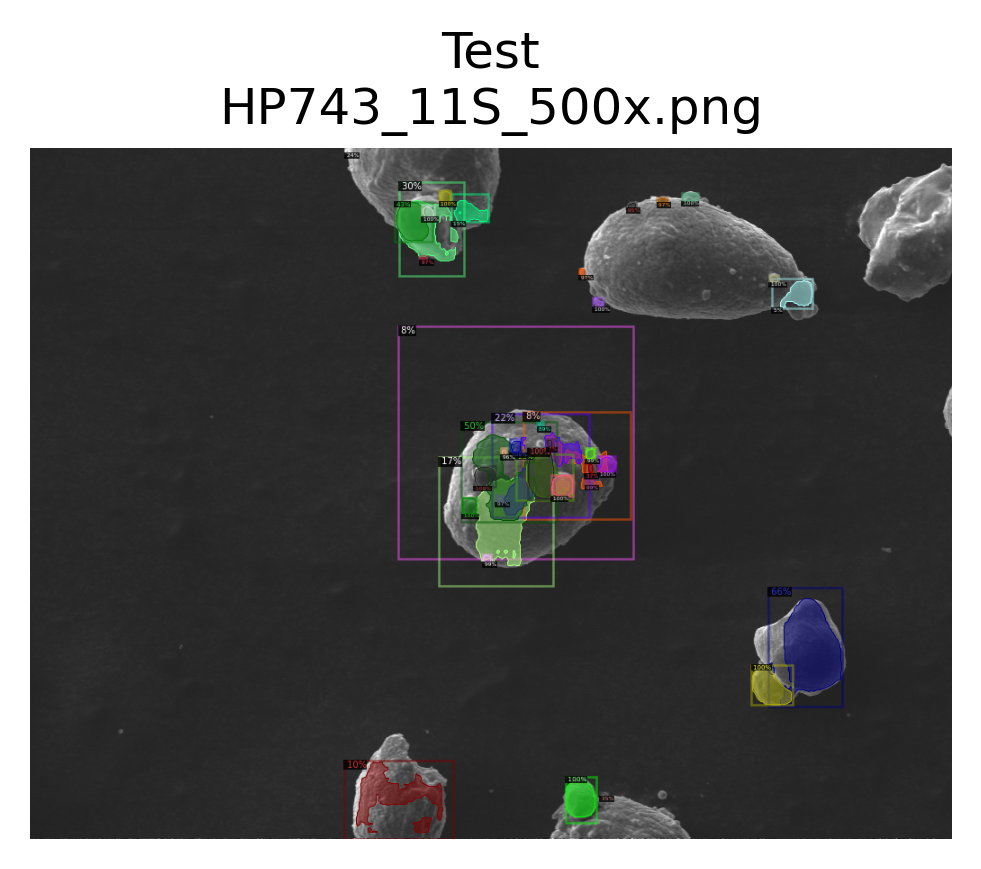

ddict info:
	path: Auto_annotate_images/HP743_11S_500x.png
	num_instances: 39
Annotating: HP743_12S_250x


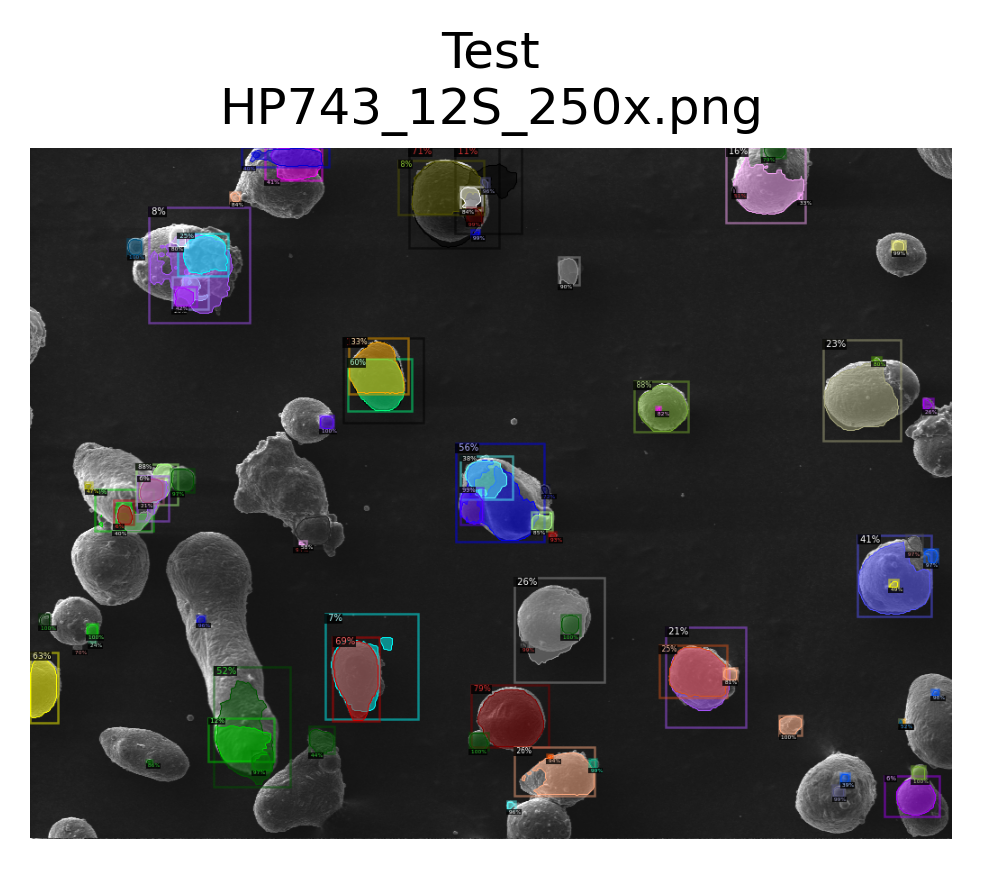

ddict info:
	path: Auto_annotate_images/HP743_12S_250x.png
	num_instances: 84
Annotating: HP743_12S_500x


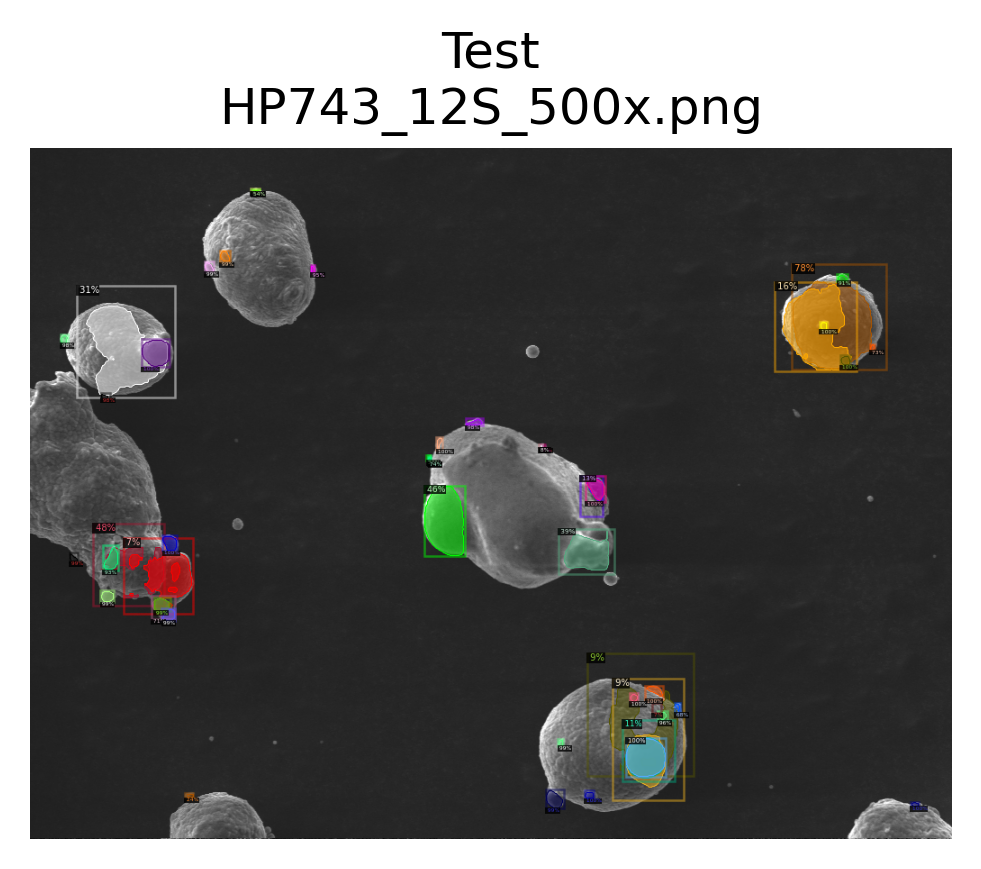

ddict info:
	path: Auto_annotate_images/HP743_12S_500x.png
	num_instances: 50
Annotating: HP743_1S_250x


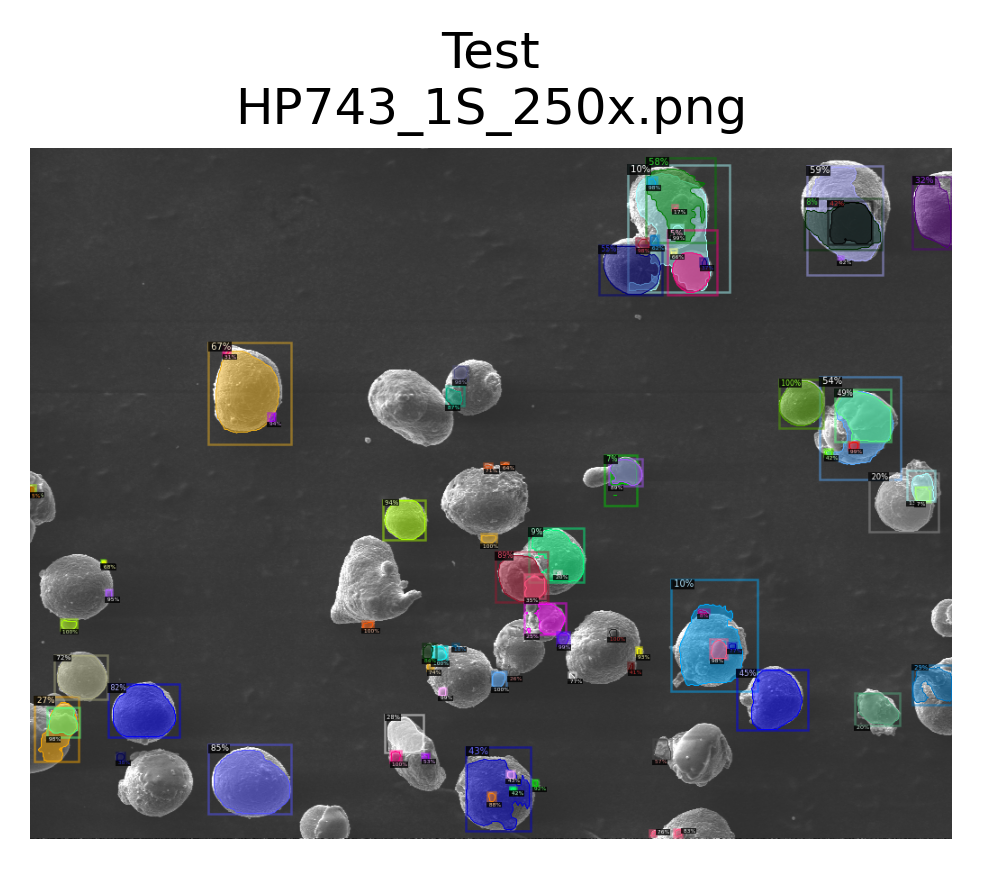

ddict info:
	path: Auto_annotate_images/HP743_1S_250x.png
	num_instances: 84
Annotating: HP743_1S_500x


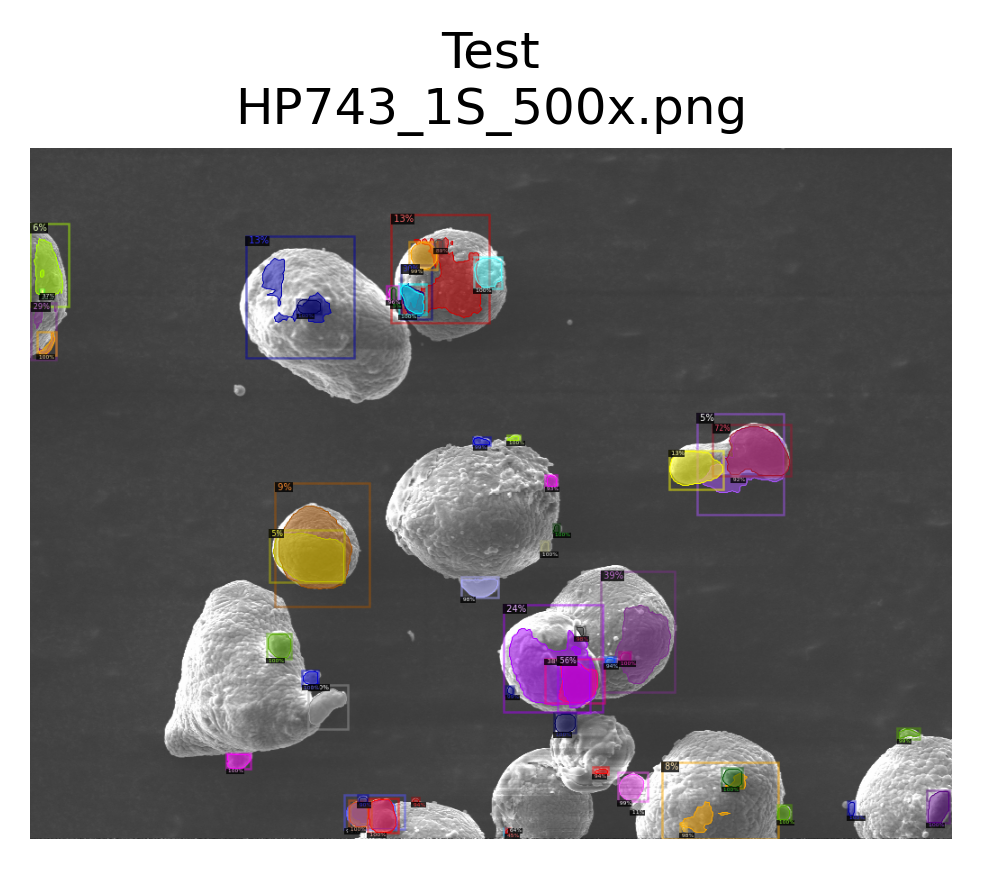

ddict info:
	path: Auto_annotate_images/HP743_1S_500x.png
	num_instances: 57
Annotating: HP743_2S_250x


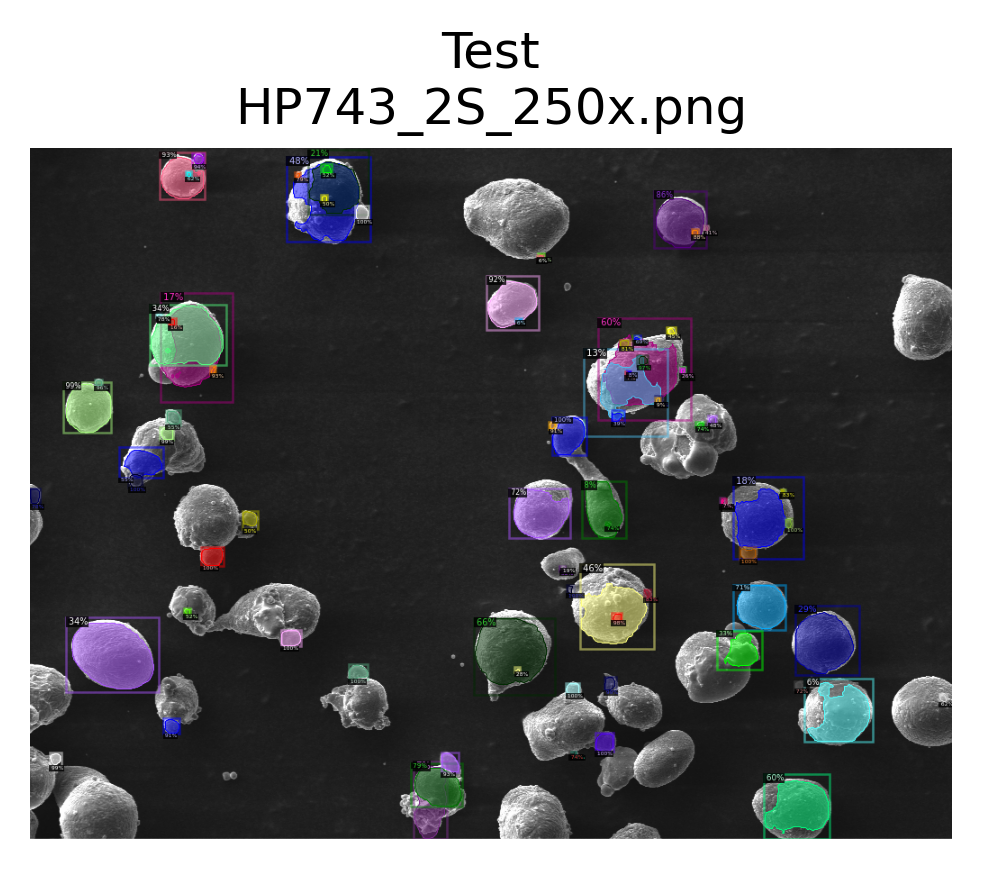

ddict info:
	path: Auto_annotate_images/HP743_2S_250x.png
	num_instances: 89
Annotating: HP743_2S_500x


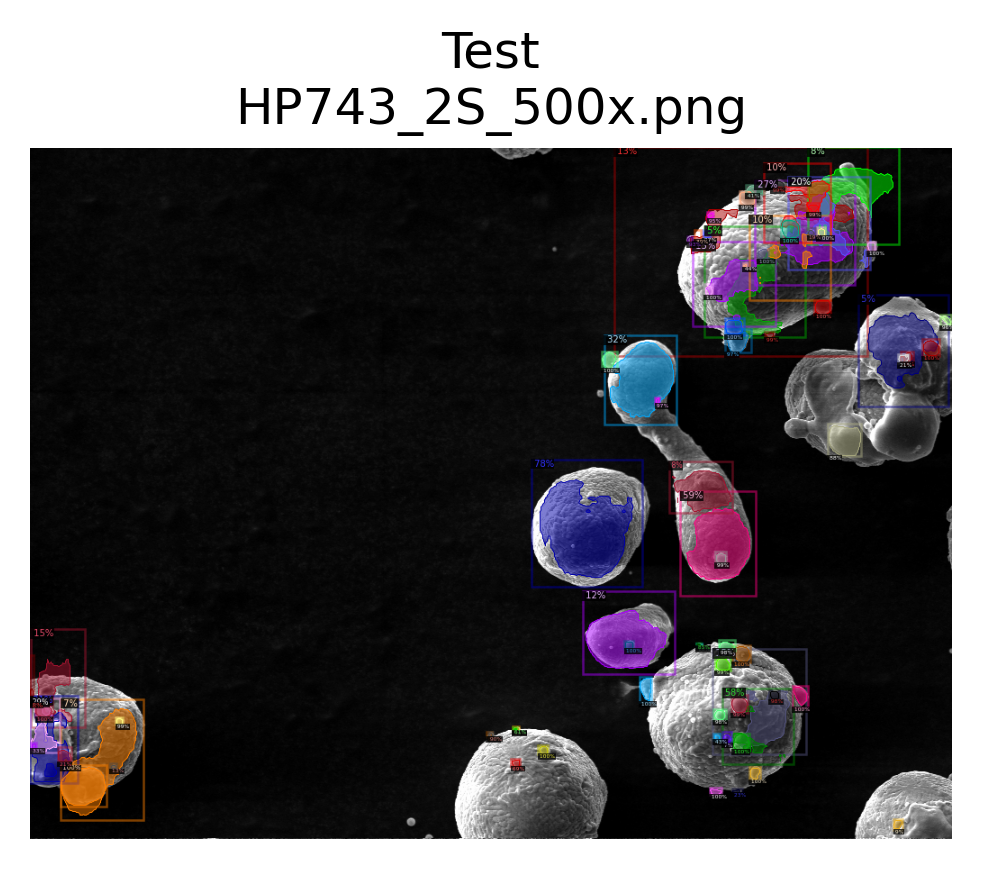

ddict info:
	path: Auto_annotate_images/HP743_2S_500x.png
	num_instances: 78
Annotating: HP743_3S_250x


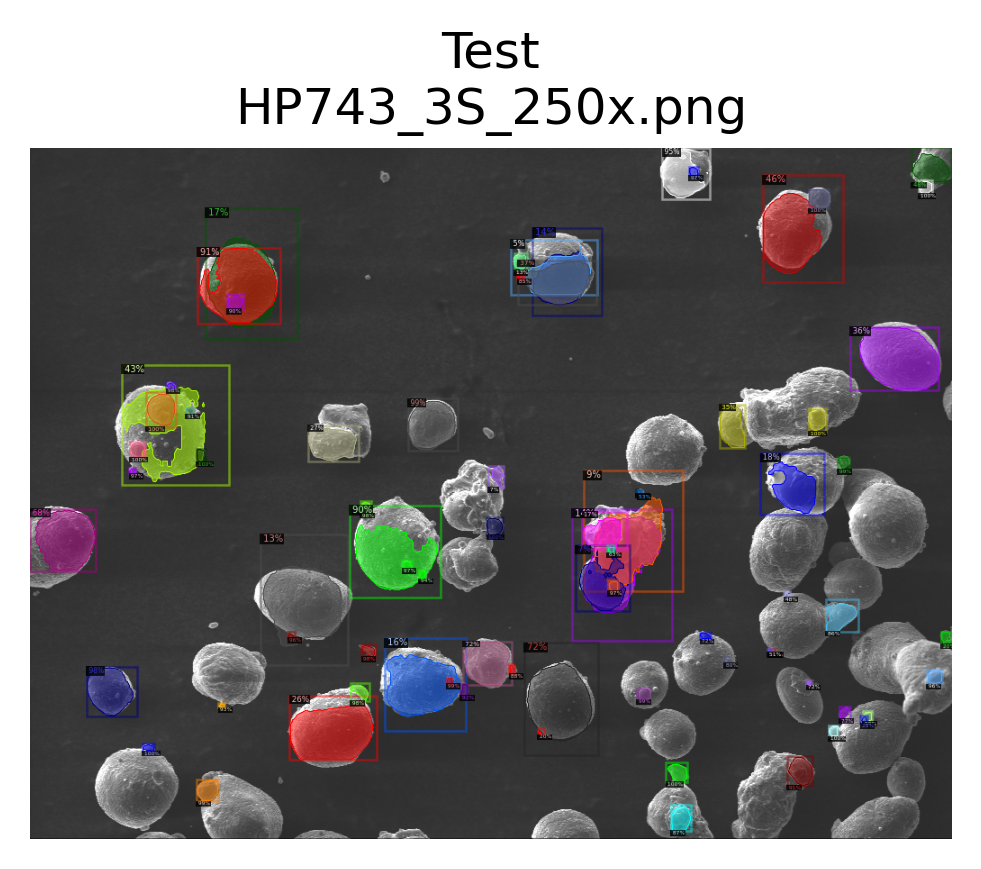

ddict info:
	path: Auto_annotate_images/HP743_3S_250x.png
	num_instances: 76
Annotating: HP743_3S_500x


KeyboardInterrupt: 

In [14]:
path = 'Auto_annotate_images'
files = os.listdir(path)
img_names = []
for f in files:
    if f.split('.')[0] != 'annotations' and f.split('.')[0] != 'AMPIS-Images':
        if f != 'S02_01_SE1_500X15.png' and f != 'S02_02_SE1_500X19.png' and f != 'S02_03_SE1_500X23.png':
            img_names.append(f.split('.')[0])
'''for f in img_names:
    print("Annotating: " + f)
    img_path = Path('..', 'data','images_png', f +'.png')
    img = cv2.imread(str(img_path))
    outs = predictor(img)
    export1 = export_anno.make_VIA_file(f +'.png', img_path, outs)
    export_anno.save_to_json(str(ampis_root) + f'/pred_annos/{EXPERIMENT_NAME}/' + f +'_anno.json', export1)
    outs = predictor(img)
    data_utils.format_outputs(img_path, dataset='test', pred=outs)
    visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save fi$
                                 gt=False,  # specifies format as model predict$
                                 img_path=img_path, # path to image
                                 suppress_labels=True, #hides class images
                                 summary=False)  #hides the end print statement'''    
img_names.sort()
print(img_names)
for f in img_names:
    if len(f) > 10:
        print("Annotating: " + f)
        img_path = Path('Auto_annotate_images', f +'.png')
        img = cv2.imread(str(img_path))
        outs = predictor(img)
        #export1 = export_anno.make_VIA_file(f +'.png', img_path, outs)
        #export_anno.save_to_json(str(ampis_root) + f'/pred_annos/{EXPERIMENT_NAME}/' + f +'_anno.json', export1)
        #outs = predictor(img)
        data_utils.format_outputs(img_path, dataset='test', pred=outs)
        visualize.display_ddicts(ddict=outs,  # predictions to display
                                     outpath=None, dataset='Test',  # don't save fi$
                                     gt=False,  # specifies format as model predict$
                                     img_path=img_path, # path to image
                                     suppress_labels=True, #hides class images
                                     summary=True)  #hides the end print statement

Annotating: S02_01_SE1_1000X16


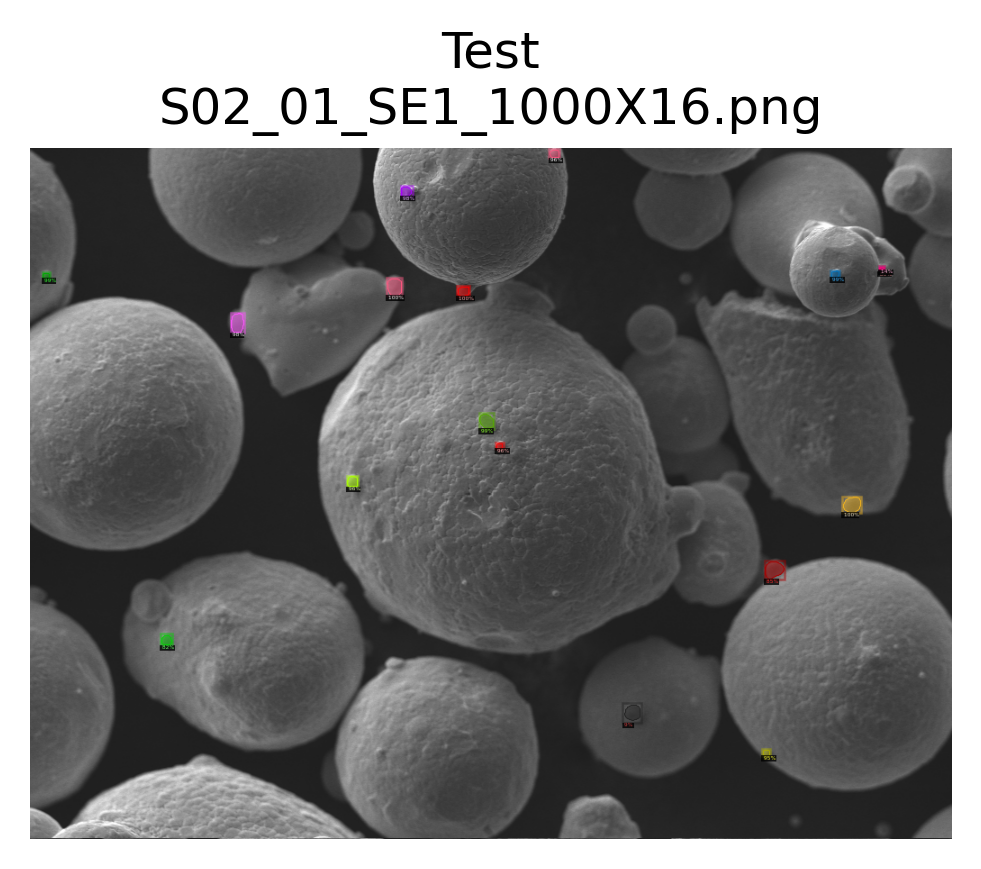

ddict info:
	path: Auto_annotate_images/S02_01_SE1_1000X16.png
	num_instances: 17
Annotating: S02_02_SE1_1000X20


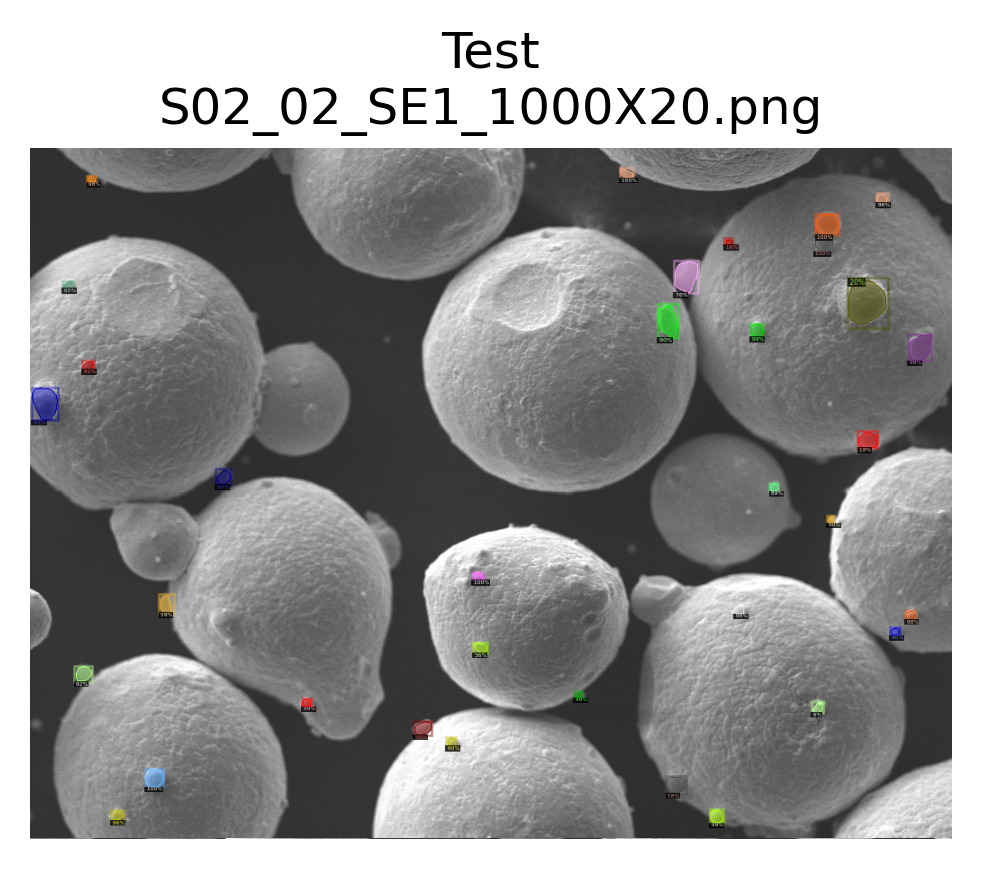

ddict info:
	path: Auto_annotate_images/S02_02_SE1_1000X20.png
	num_instances: 34
Annotating: S02_03_SE1_1000X24


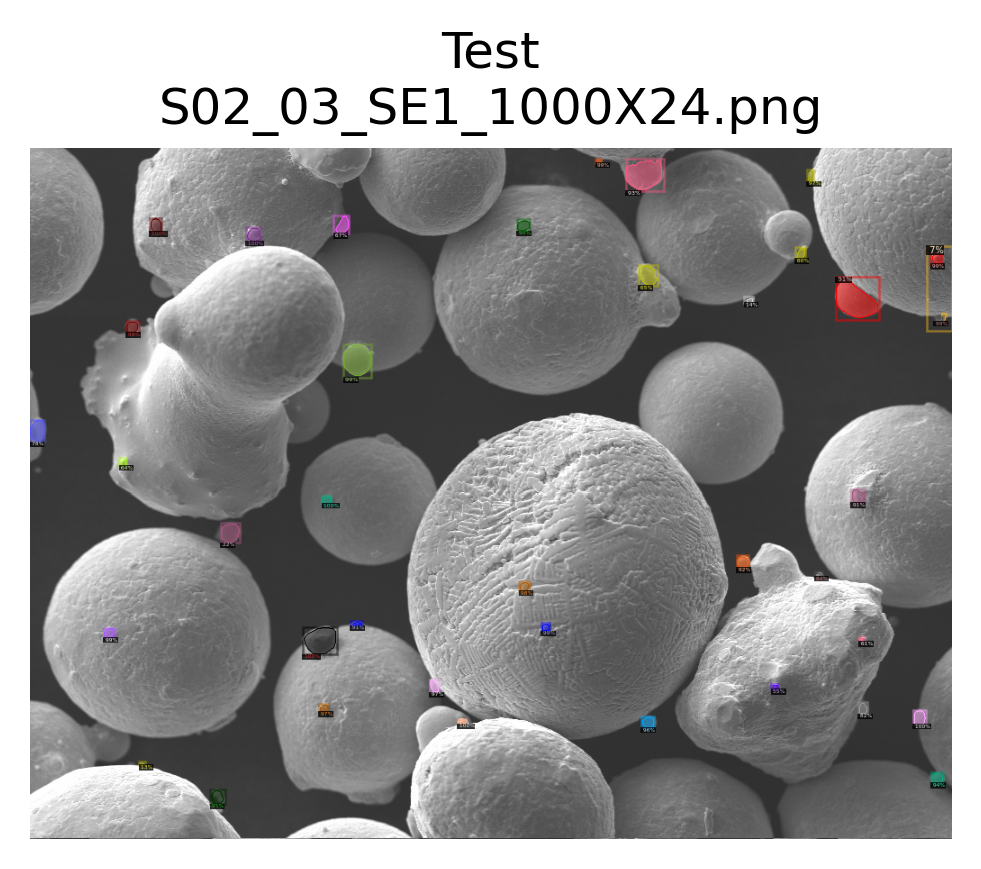

ddict info:
	path: Auto_annotate_images/S02_03_SE1_1000X24.png
	num_instances: 39


In [6]:
t = ['S02_01_SE1_1000X16', 'S02_02_SE1_1000X20','S02_03_SE1_1000X24']
for f in t:
    print("Annotating: " + f)
    img_path = Path('Auto_annotate_images', f +'.png')
    img = cv2.imread(str(img_path))
    outs = predictor(img)
    export1 = export_anno.make_VIA_file(f +'.png', img_path, outs)
    export_anno.save_to_json(str(root) + f'/pred_annos/{EXPERIMENT_NAME}/' + f +'_anno.json', export1)
    outs = predictor(img)
    data_utils.format_outputs(img_path, dataset='test', pred=outs)
    visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save fi$
                                 gt=False,  # specifies format as model predict$
                                 img_path=img_path, # path to image
                                 suppress_labels=True, #hides class images
                                 summary=True)  #hides the end print statement


In [14]:
import csv
#path = str(ampis_root) + '/examples/powder/data/Auto_annotate_images'
f = open(str(ampis_root) + '/pred_annos/satellite/progess.csv', 'w')
header = ['Image Name', 'Round Used', 'Anno Predicted', 'Anno Removes', 'Total Anno']
l = []
for i in img_names:
    l.append([i,0,0,0,0])

with open((str(ampis_root) + '/pred_annos/satellite/progess.csv'), 'w', encoding='UTF8', newline='') as f:
    writer = csv.writer(f)
    # write the header
    writer.writerow(header)
    # write multiple rows
    writer.writerows(l)



### Visualizing detections


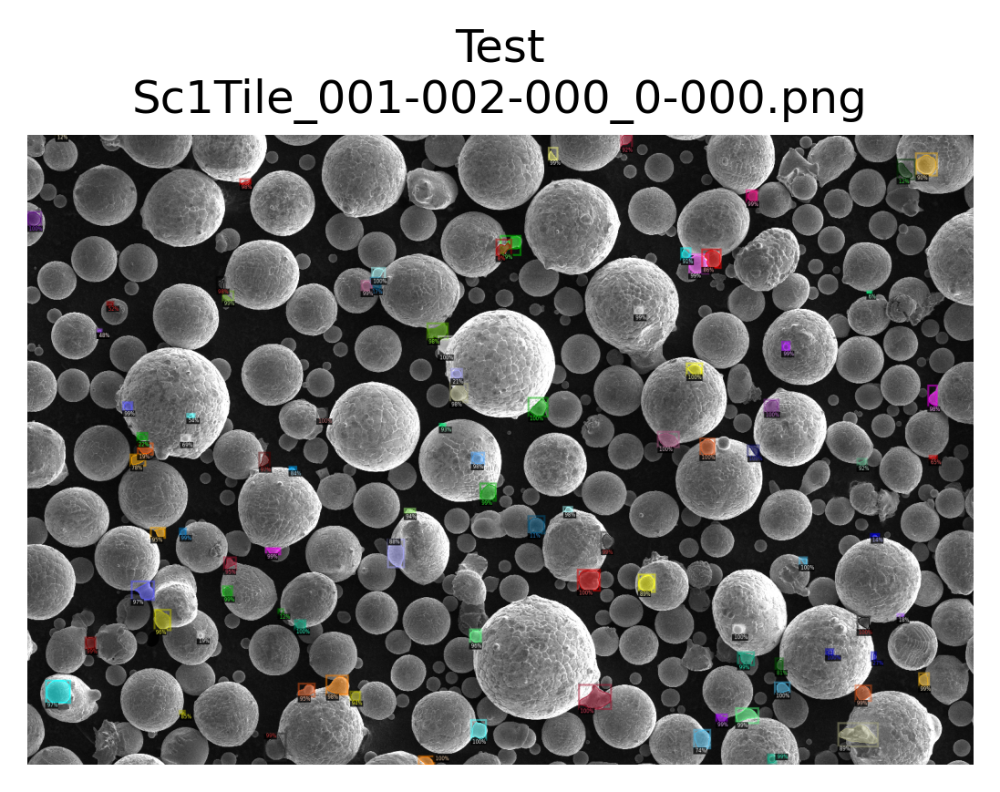

In [21]:
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save fi$
                                 gt=False,  # specifies format as model predict$
                                 img_path=img_path, # path to image
                                 suppress_labels=True, #hides class images
                                 summary=False)  #hides the end print statement